In [ ]:
# Install core dependencies
!pip install torch torchvision torchaudio --index-url https://download.pytorch.org/whl/cu118
!pip install hydra-core iopath pycocotools opencv-python matplotlib Pillow huggingface_hub
!pip install 'git+https://github.com/facebookresearch/detectron2.git'
!pip install --quiet --upgrade torch==2.0.1+cu118 torchvision==0.15.2+cu118 torchaudio==2.0.2+cu118 \
    -f https://download.pytorch.org/whl/torch_stable.html

Looking in indexes: https://download.pytorch.org/whl/cu118
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 42.2/42.2 kB 1.4 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 154.5/154.5 kB 4.1 MB/s eta 0:00:00
  Created wheel for iopath: filename=iopath-0.1.10-py3-none-any.whl size=31527 sha256=7439d9b3cf0e31e77c7e275984f39204b8e880d298f7e5666fa5a2b58262471a
  Stored in directory: /root/.cache/pip/wheels/ba/5e/16/6117f8fe7e9c0c161a795e10d94645ebcf301ccbd01f66d8ec
Successfully built iopath
  Cloning https://github.com/facebookresearch/detectron2.git to /tmp/pip-req-build-kt6fha48
  Running command git clone --filter=blob:none --quiet https://github.com/facebookresearch/detectron2.git /tmp/pip-req-build-kt6fha48
  Resolved https://github.com/facebookresearch/detectron2.git to commit d38d7161247e64276d4c44d9d0605291e80bd969
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 50.2/50.2 kB 1.8 MB/s eta 0:00

In [ ]:
# Clone SAM2 Repository
!git clone https://github.com/facebookresearch/segment-anything-2.git
%cd segment-anything-2

Cloning into 'segment-anything-2'...
remote: Enumerating objects: 1070, done.
remote: Total 1070 (delta 0), reused 0 (delta 0), pack-reused 1070 (from 1)
Receiving objects: 100% (1070/1070), 128.11 MiB | 40.97 MiB/s, done.
Resolving deltas: 100% (381/381), done.
/content/segment-anything-2


In [ ]:
from google.colab import files
uploaded = files.upload()  # sam2_hiera_tiny.pt and sam2_hiera_t.yaml


Saving sam2_hiera_tiny.pt to sam2_hiera_tiny.pt
Saving sam2_hiera_t.yaml to sam2_hiera_t.yaml


In [ ]:
from google.colab import files
uploaded = files.upload()  # choose data_2D.zip here

Saving CMU10_3D (1).zip to CMU10_3D (1).zip


In [ ]:
# Import Libraries

import os
import glob
import shutil
import numpy as np
import torch
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from PIL import Image


In [ ]:
# Clone & Install SAM2 Locally

!git clone https://github.com/facebookresearch/segment-anything-2.git
%cd segment-anything-2
!pip install -e .
%cd /content


Cloning into 'segment-anything-2'...
remote: Enumerating objects: 1070, done.
remote: Total 1070 (delta 0), reused 0 (delta 0), pack-reused 1070 (from 1)
Receiving objects: 100% (1070/1070), 128.11 MiB | 41.58 MiB/s, done.
Resolving deltas: 100% (381/381), done.
/content/segment-anything-2/segment-anything-2
Obtaining file:///content/segment-anything-2/segment-anything-2
  Installing build dependencies ... done
  Checking if build backend supports build_editable ... done
  Getting requirements to build editable ... done
  Preparing editable metadata (pyproject.toml) ... done
  Using cached torch-2.8.0-cp311-cp311-manylinux_2_28_x86_64.whl.metadata (30 kB)
  Using cached iopath-0.1.10-py3-none-any.whl
  Using cached sympy-1.14.0-py3-none-any.whl.metadata (12 kB)
  Using cached nvidia_cuda_nvrtc_cu12-12.8.93-py3-none-manylinux2010_x86_64.manylinux_2_12_x86_64.whl.metadata (1.7 kB)
  Using cached nvidia_cuda_runtime_cu12-12.8.90-py3-none-manylinux2014_x86_64.manylinux_2_17_x86_64.whl.meta

/content


In [ ]:
# Import SAM2 Components

from sam2.build_sam import build_sam2, build_sam2_video_predictor
from sam2.automatic_mask_generator import SAM2AutomaticMaskGenerator
from sam2.sam2_image_predictor import SAM2ImagePredictor

In [ ]:
# Define Tracking Function

def track_item_boxes(imgpath1, imgpath2, img1boxclasslist, visualize=True):
    create_if_not_exists(tempfolder)
    cleardir(tempfolder)
    shutil.copy(imgpath1, tempfolder + "/00000.jpg")
    shutil.copy(imgpath2, tempfolder + "/00001.jpg")

    inference_state = predictor_vid.init_state(video_path="./tempdir")
    predictor_vid.reset_state(inference_state)

    ann_frame_idx = 0
    for img1boxclass in img1boxclasslist:
        ([xmin, xmax, ymin, ymax], objectnumint) = img1boxclass
        box = np.array([xmin, ymin, xmax, ymax], dtype=np.float32)
        _, out_obj_ids, out_mask_logits = predictor_vid.add_new_points_or_box(
            inference_state=inference_state,
            frame_idx=ann_frame_idx,
            obj_id=objectnumint,
            box=box,
        )

    video_segments = {}

    for out_frame_idx, out_obj_ids, out_mask_logits in predictor_vid.propagate_in_video(inference_state):
        video_segments[out_frame_idx] = {
            out_obj_id: (out_mask_logits[i] > 0.0).cpu().numpy()
            for i, out_obj_id in enumerate(out_obj_ids)
        }

    if visualize:
        fig, ax = plt.subplots()
        plt.title("Original Image")
        ax.imshow(Image.open(tempfolder + "/00000.jpg"))
        rect = patches.Rectangle((xmin, ymin), xmax - xmin, ymax - ymin, linewidth=1, edgecolor='r', facecolor='none')
        ax.add_patch(rect)
        plt.show()

        out_frame_idx = 1
        plt.figure(figsize=(6, 4))
        plt.title(f"detected object in test image ::")
        plt.imshow(Image.open(tempfolder + "/00001.jpg"))
        for out_obj_id, out_mask in video_segments[out_frame_idx].items():
            show_mask(out_mask, plt.gca(), obj_id=out_obj_id)

    return video_segments


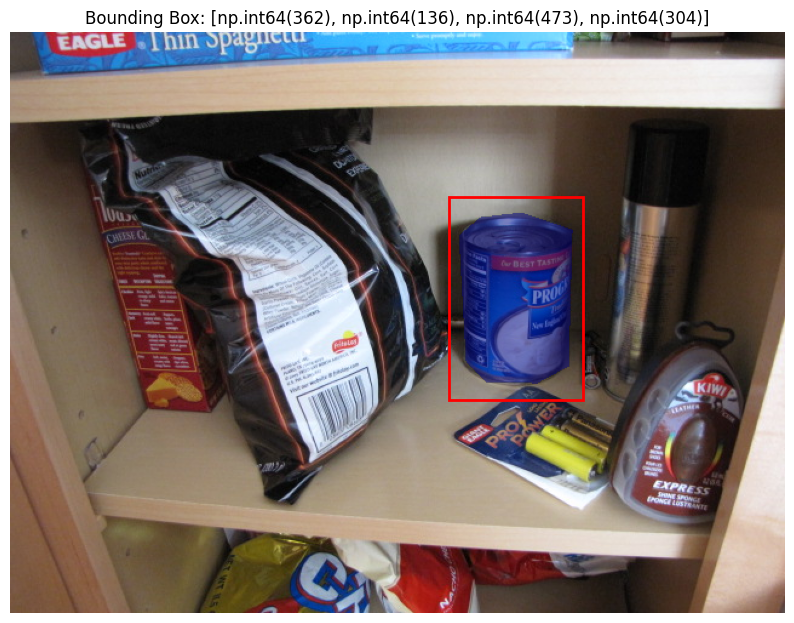

Bounding box: [np.int64(362), np.int64(136), np.int64(473), np.int64(304)]


In [ ]:
# Process Image & Mask

import numpy as np
from PIL import Image
import matplotlib.pyplot as plt

def process_img_mask_pair(img_path, mask_path, visualize=True):
    """Simplified version to get bounding box from image-mask pair"""
    # Load and process images
    image = np.array(Image.open(img_path))
    mask = np.array(Image.open(mask_path)) > 128  # Convert to binary mask

    # Get bounding box with padding
    y, x = np.where(mask)
    if not x.size:  # If mask is empty
        bbox = [0, 0, *image.shape[:2][::-1]]  # [xmin, ymin, width, height]
    else:
        padding = 0.1  # 10% padding
        xmin, xmax = x.min(), x.max()
        ymin, ymax = y.min(), y.max()
        pad_x = int((xmax - xmin) * padding)
        pad_y = int((ymax - ymin) * padding)
        bbox = [
            max(0, xmin - pad_x),
            max(0, ymin - pad_y),
            min(image.shape[1], xmax + pad_x),
            min(image.shape[0], ymax + pad_y)
        ]

    # Visualization
    if visualize:
        plt.figure(figsize=(10, 10))
        plt.imshow(image)
        plt.imshow(np.ma.masked_where(~mask, mask), alpha=0.5, cmap='jet')
        plt.gca().add_patch(plt.Rectangle(
            (bbox[0], bbox[1]), bbox[2]-bbox[0], bbox[3]-bbox[1],
            linewidth=2, edgecolor='r', facecolor='none'
        ))
        plt.title(f"Bounding Box: {bbox}")
        plt.axis('off')
        plt.show()

    return bbox

# Usage remains the same
bbox = process_img_mask_pair(
    "/content/CMU10_3D (1)/CMU10_3D/data_2D/can_chowder_000001.jpg",
    "/content/CMU10_3D (1)/CMU10_3D/data_2D/can_chowder_000001_1_gt.png"
)
print("Bounding box:", bbox)


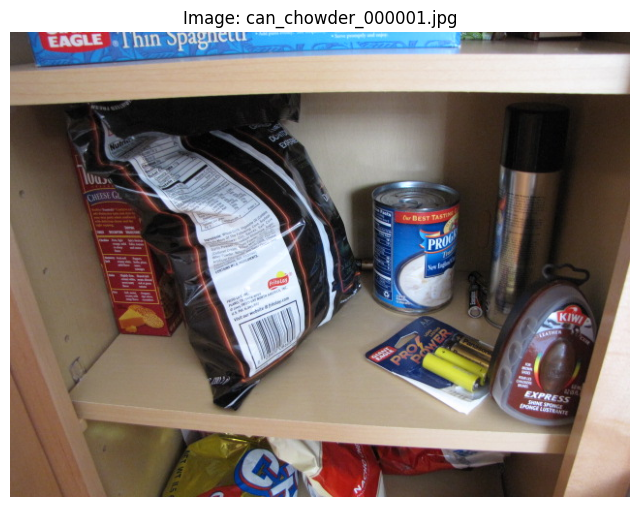

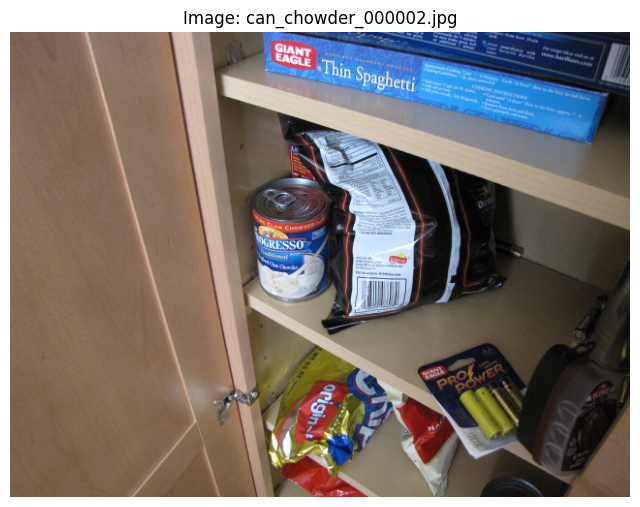

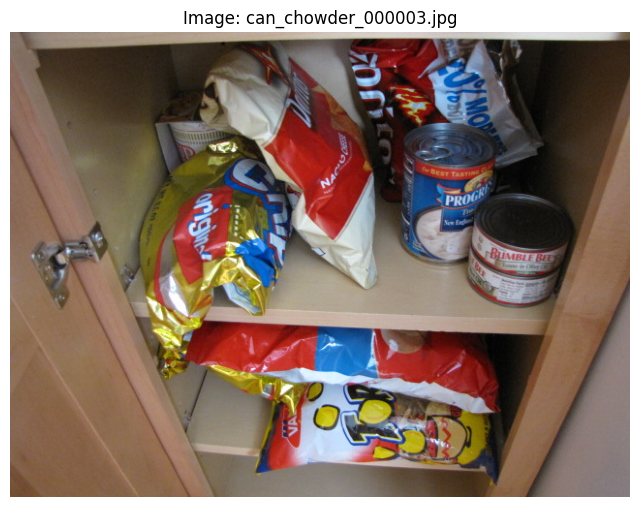

In [ ]:
# Display & Check Multiple Images

import matplotlib.pyplot as plt
from PIL import Image

# Your paths
imgpaths = [
    '/content/CMU10_3D (1)/CMU10_3D/data_2D/can_chowder_000001.jpg',
    '/content/CMU10_3D (1)/CMU10_3D/data_2D/can_chowder_000002.jpg',
    '/content/CMU10_3D (1)/CMU10_3D/data_2D/can_chowder_000003.jpg'
]


# Display each image
for path in imgpaths:
    img = Image.open(path)
    plt.figure(figsize=(8, 8))
    plt.imshow(img)
    plt.title(f'Image: {path.split("/")[-1]}')  # Extracts filename
    plt.axis('off')
    plt.show()

In [ ]:
# Verify Dataset Paths
import os
input_dir = '/content/CMU10_3D (1)/CMU10_3D/data_2D'  # Your images and masks
output_dir = '/content/CMU10_3D (1)/CMU10_3D/data_2D'  # Same as input_dir

# Verify files exist
print("Sample files in directory:")
print(os.listdir(input_dir)[:5])


Sample files in directory:
['carton_oj_000006_1_gt.png', 'diet_coke_000028.jpg', 'diet_coke_000009_1_gt.png', 'hc_potroastsoup_000049_2_gt.png', 'can_tomatosoup_000012_1_gt.png']


In [ ]:
# Import SAM2 Libraries

import torch
from sam2.build_sam import build_sam2
from sam2.build_sam import build_sam2_video_predictor
import os, glob, shutil
from PIL import Image
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import numpy as np


In [ ]:

# === Model paths ===
model_cfg_name = "sam2_hiera_t"  # Hydra wants config name, not full path
checkpoint = "/content/segment-anything-2/sam2_hiera_tiny.pt"


# === Temp folder ===
tempfolder = "./tempdir"
os.makedirs(tempfolder, exist_ok=True)

# === Device ===
device = "cuda" if torch.cuda.is_available() else "cpu"
print(f"Using device: {device}")

# === Load model ===
sam2 = build_sam2(model_cfg_name, checkpoint, device=device, apply_postprocessing=False)
predictor_prompt = SAM2ImagePredictor(sam2)
mask_generator = SAM2AutomaticMaskGenerator(sam2)
predictor_vid = build_sam2_video_predictor(model_cfg_name, checkpoint, device=device)

print("✅ Model loaded successfully!")

Using device: cpu
✅ Model loaded successfully!


In [ ]:
# Temporary directory setup

tempfolder = "./tempdir"
def create_if_not_exists(dirname):
    if not os.path.exists(dirname):
        os.mkdir(dirname)
def cleardir(tempfolder):
    filepaths = glob.glob(tempfolder+"/*")
    for filepath in filepaths:
        os.unlink(filepath)

In [ ]:
object_types = [
    'can_chowder', 'can_soymilk', 'can_tomatosoup',
    'carton_oj', 'carton_soymilk', 'diet_coke',
    'hc_potroastsoup', 'juicebox', 'rice_tuscan', 'ricepilaf'
]

In [ ]:
input_dir = '/content/CMU10_3D (1)/CMU10_3D/data_2D'
results = []

for obj in object_types:
print(f"\n🔍 Processing {obj}...")

# Get reference image and mask paths
    ref_img = f"{input_dir}/{obj}_000001.jpg"
    ref_mask = f"{input_dir}/{obj}_000001_1_gt.png"

# Get bounding box from mask (using provided approach)
    mask = np.array(Image.open(ref_mask))
    contours, _ = cv2.findContours(mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    x,y,w,h = cv2.boundingRect(contours[0])
    ref_box = [x, x+w, y, y+h]

# Process all other images of this type
    all_images = [f for f in os.listdir(input_dir)
                 if f.startswith(obj) and f.endswith('.jpg') and not f.endswith('_000001.jpg')]

    for img_file in all_images:
        target_img = f"{input_dir}/{img_file}"

# Use provided track_item_boxes function
        video_segments = track_item_boxes(
            imgpath1=ref_img,
            imgpath2=target_img,
            img1boxclasslist=[(ref_box, 1)],  # Using object ID=1
            visualize=False)

# Get predicted mask
        pred_mask = video_segments[1][1]  # frame 1, object ID 1

# Save results
        results.append({
            'object': obj,
            'image': img_file,
            'pred_mask': pred_mask,
            'ref_box': ref_box})

print(f"✅ Processed {len(all_images)} images for {obj}")


🔍 Processing can_chowder...


frame loading (JPEG): 100%|██████████| 2/2 [00:00<00:00, 24.83it/s]
/content/segment-anything-2/segment-anything-2/sam2/sam2_video_predictor.py:786: UserWarning: cannot import name '_C' from 'sam2' (/content/segment-anything-2/segment-anything-2/sam2/__init__.py)

Skipping the post-processing step due to the error above. You can still use SAM 2 and it's OK to ignore the error above, although some post-processing functionality may be limited (which doesn't affect the results in most cases; see https://github.com/facebookresearch/sam2/blob/main/INSTALL.md).
  pred_masks_gpu = fill_holes_in_mask_scores(
propagate in video: 100%|██████████| 2/2 [00:09<00:00,  4.85s/it]


✅ Processed 49 images for can_chowder

🔍 Processing can_soymilk...


propagate in video: 100%|██████████| 2/2 [00:10<00:00,  5.18s/it]


✅ Processed 49 images for can_soymilk

🔍 Processing can_tomatosoup...


propagate in video: 100%|██████████| 2/2 [00:09<00:00,  4.75s/it]


✅ Processed 49 images for can_tomatosoup

🔍 Processing carton_oj...


propagate in video: 100%|██████████| 2/2 [00:10<00:00,  5.09s/it]


✅ Processed 49 images for carton_oj

🔍 Processing carton_soymilk...


propagate in video: 100%|██████████| 2/2 [00:09<00:00,  4.85s/it]


✅ Processed 49 images for carton_soymilk

🔍 Processing diet_coke...


propagate in video: 100%|██████████| 2/2 [00:09<00:00,  4.94s/it]


✅ Processed 49 images for diet_coke

🔍 Processing hc_potroastsoup...


propagate in video: 100%|██████████| 2/2 [00:10<00:00,  5.03s/it]


✅ Processed 49 images for hc_potroastsoup

🔍 Processing juicebox...


propagate in video: 100%|██████████| 2/2 [00:09<00:00,  4.80s/it]


✅ Processed 49 images for juicebox

🔍 Processing rice_tuscan...


propagate in video: 100%|██████████| 2/2 [00:09<00:00,  4.77s/it]


✅ Processed 49 images for rice_tuscan

🔍 Processing ricepilaf...


propagate in video: 100%|██████████| 2/2 [00:09<00:00,  4.55s/it]

✅ Processed 49 images for ricepilaf


Reference image exists: True
Reference mask exists: True
Target image exists: True

Running detection...


propagate in video: 100%|██████████| 2/2 [00:09<00:00,  4.87s/it]


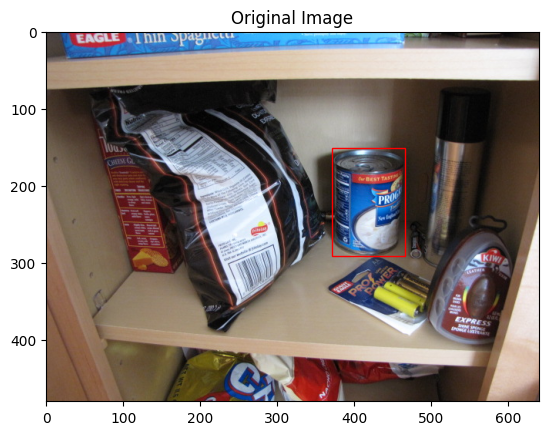

✅ Detection successful!


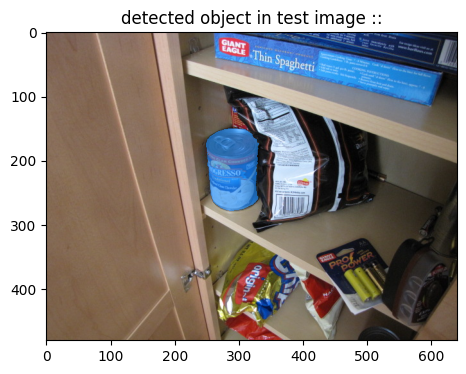

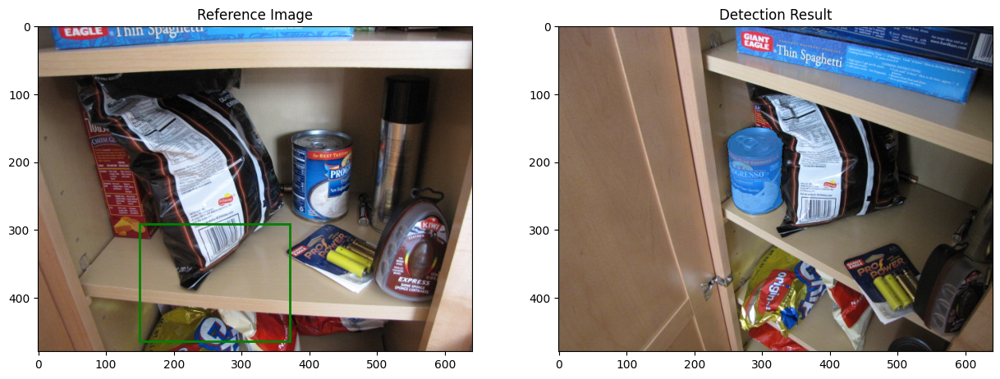

In [ ]:
# 1. First define all required helper functions
def show_mask(mask, ax, obj_id=None, random_color=False):
    """Visualize a segmentation mask (provided in assignment)"""
    if random_color:
        color = np.concatenate([np.random.random(3), np.array([0.6])], axis=0)
    else:
        color = np.array([30/255, 144/255, 255/255, 0.6])  # Default blue color
    h, w = mask.shape[-2:]
    mask_image = mask.reshape(h, w, 1) * color.reshape(1, 1, -1)
    ax.imshow(mask_image)

def show_points(coords, labels, ax, marker_size=200):
    """Visualize input points (not used here but required)"""
    pos_points = coords[labels==1]
    neg_points = coords[labels==0]
    ax.scatter(pos_points[:, 0], pos_points[:, 1], color='green', marker='*', s=marker_size)
    ax.scatter(neg_points[:, 0], neg_points[:, 1], color='red', marker='*', s=marker_size)

def show_box(box, ax):
    """Visualize bounding box (provided in assignment)"""
    x0, y0 = box[0], box[1]
    w, h = box[2] - box[0], box[3] - box[1]
    ax.add_patch(plt.Rectangle((x0, y0), w, h, edgecolor='green', facecolor=(0,0,0,0), lw=2))


# 2. Now run your detection test
input_dir = '/content/CMU10_3D (1)/CMU10_3D/data_2D'
test_obj = 'can_chowder'

# Verify files exist
ref_img = f"{input_dir}/{test_obj}_000001.jpg"
ref_mask = f"{input_dir}/{test_obj}_000001_1_gt.png"
target_img = f"{input_dir}/{test_obj}_000002.jpg"

print(f"Reference image exists: {os.path.exists(ref_img)}")
print(f"Reference mask exists: {os.path.exists(ref_mask)}")
print(f"Target image exists: {os.path.exists(target_img)}")

if not all([os.path.exists(ref_img), os.path.exists(ref_mask), os.path.exists(target_img)]):
    print("❌ Missing required files!")
else:

# Process reference mask
    mask = np.array(Image.open(ref_mask))
    contours, _ = cv2.findContours(mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    x,y,w,h = cv2.boundingRect(contours[0])
    ref_box = [x, x+w, y, y+h]

# Run detection
    print("\nRunning detection...")
    video_segments = track_item_boxes(
        imgpath1=ref_img,
        imgpath2=target_img,
        img1boxclasslist=[(ref_box, 1)],
        visualize=True)

# Check results
    if video_segments and 1 in video_segments[1]:
        print("✅ Detection successful!")
        pred_mask = video_segments[1][1]

# Visualize results
  fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 6))

# Original reference
  ax1.imshow(Image.open(ref_img))
  show_box(ref_box, ax1)
  ax1.set_title("Reference Image")

# Detection result
  ax2.imshow(Image.open(target_img))
  show_mask(pred_mask, ax2)
  ax2.set_title("Detection Result")
  plt.show()
else:
  print("❌ Detection failed. Possible solutions:")
  print("1. Add padding to reference box (try [x-10, x+w+10, y-10, y+h+10])")
  print("2. Verify SAM2 model loaded correctly")
  print("3. Check image paths are correct")

In [ ]:
output_data = []

for result in results:
    try:
        # Get the prediction mask
        pred_mask = result['pred_mask']

        # Handle different mask formats:
        # Case 1: If mask is 3D (H,W,1) or (1,H,W)
        if pred_mask.ndim == 3:
            pred_mask = pred_mask.squeeze()  # Remove single-dimensional entries

        # Case 2: If still not 2D, take first channel
        if pred_mask.ndim > 2:
            pred_mask = pred_mask[..., 0]  # Take first channel

        # Verify we have a 2D mask
        if pred_mask.ndim != 2:
            print(f"⚠️ Unexpected mask shape {pred_mask.shape} in {result['image']}")
            continue

        # Find object coordinates
        rows, cols = np.where(pred_mask)

        if len(rows) > 0:  # Only if object detected
            xmin, xmax = min(cols), max(cols)
            ymin, ymax = min(rows), max(rows)

            output_data.append({
                'object': result['object'],
                'image': result['image'],
                'pred_box': f"[{xmin}, {xmax}, {ymin}, {ymax}]"
            })

    except Exception as e:
        print(f"⚠️ Error processing {result.get('image','unknown')}: {str(e)}")

# Save results
if output_data:
    preds_path = f"{input_dir}/sam2_predictions.csv"
    pd.DataFrame(output_data).to_csv(preds_path, index=False)
    print(f"✅ Saved {len(output_data)} predictions to {preds_path}")

    # Show sample output
    print("\nSample predictions:")
    print(pd.DataFrame(output_data).head())
else:
    print("❌ No predictions to save! Check your detection results.")

✅ Saved 258 predictions to /content/CMU10_3D (1)/CMU10_3D/data_2D/sam2_predictions.csv

Sample predictions:
        object                   image              pred_box
0  can_chowder  can_chowder_000002.jpg  [249, 331, 150, 278]
1  can_chowder  can_chowder_000016.jpg  [246, 330, 171, 263]
2  can_chowder  can_chowder_000006.jpg  [439, 533, 132, 252]
3  can_chowder  can_chowder_000050.jpg  [176, 271, 322, 431]
4  can_chowder  can_chowder_000032.jpg  [206, 470, 270, 479]


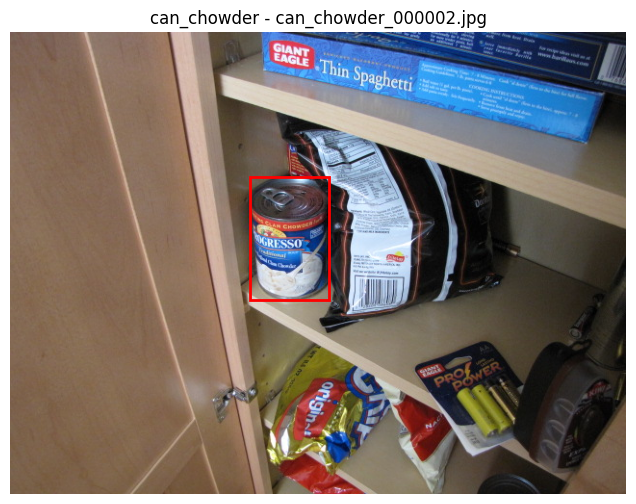

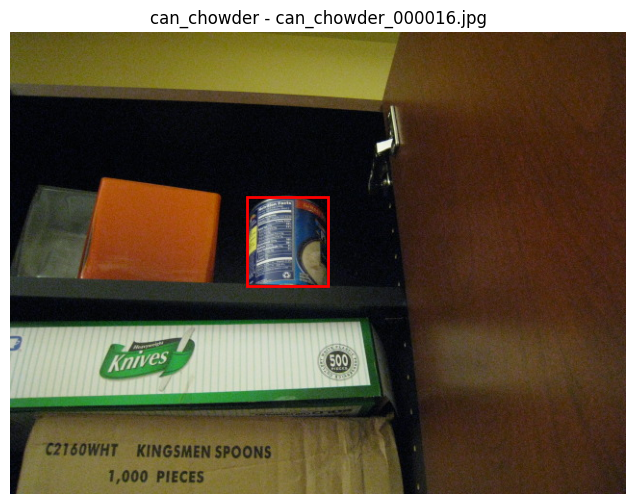

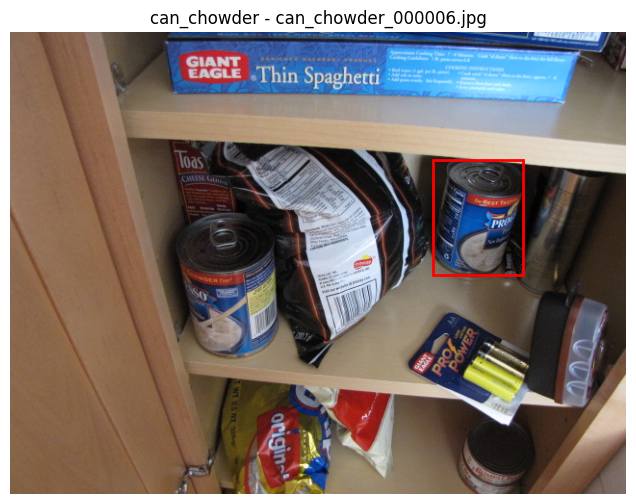

In [ ]:
# Drawing Bounding Box

def plot_prediction(idx):
    """Plot prediction with bounding box overlay"""
    row = output_data[idx]
    img_path = f"{input_dir}/{row['image']}"
    img = Image.open(img_path)
    box = eval(row['pred_box'])  # Convert string to list

    fig, ax = plt.subplots(figsize=(8,6))
    ax.imshow(img)
    rect = patches.Rectangle(
        (box[0], box[2]), box[1]-box[0], box[3]-box[2],
        linewidth=2, edgecolor='r', facecolor='none'
    )
    ax.add_patch(rect)
    plt.title(f"{row['object']} - {row['image']}")
    plt.axis('off')
    plt.show()

# Visualize first 3 predictions
for i in range(3):
    plot_prediction(i)

In [ ]:
# Analyze the sizes of predicted bounding boxes from your object
boxes = [eval(x['pred_box']) for x in output_data]
widths = [b[1]-b[0] for b in boxes]
heights = [b[3]-b[2] for b in boxes]

print(f"Average width: {np.mean(widths):.1f} ± {np.std(widths):.1f} px")
print(f"Average height: {np.mean(heights):.1f} ± {np.std(heights):.1f} px")
print(f"Total objects detected: {len(output_data)}")

Average width: 157.2 ± 88.8 px
Average height: 179.4 ± 63.9 px
Total objects detected: 258


In [ ]:
# Load ground truth masks
gt_data = []
for pred in output_data:
    gt_path = f"{input_dir}/{pred['image'].replace('.jpg','_1_gt.png')}"
    if os.path.exists(gt_path):
        gt_mask = np.array(Image.open(gt_path))
        contours, _ = cv2.findContours(gt_mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
        if contours:
            x,y,w,h = cv2.boundingRect(contours[0])
            gt_data.append({
                'image': pred['image'],
                'gt_box': [x, x+w, y, y+h]
            })

# Create comparison DataFrame
comparison_df = pd.merge(
    pd.DataFrame(output_data),
    pd.DataFrame(gt_data),
    on='image'
)
print(f"Matched {len(comparison_df)} predictions with ground truth")

Matched 258 predictions with ground truth


✅ Total predictions available: 258


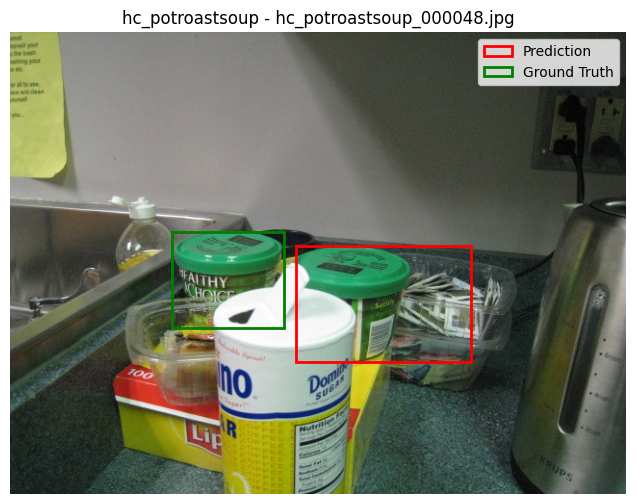

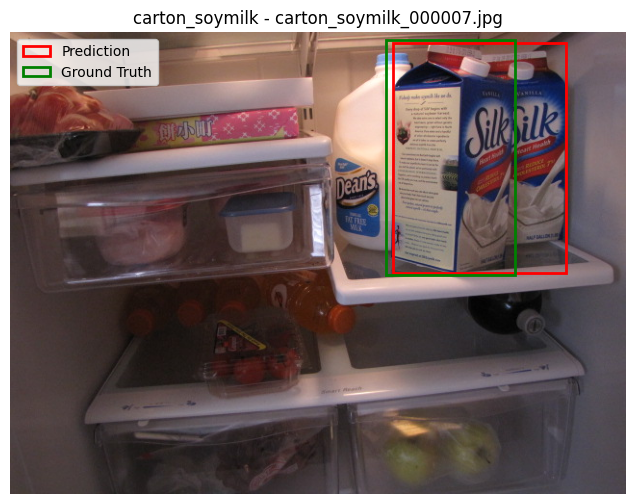

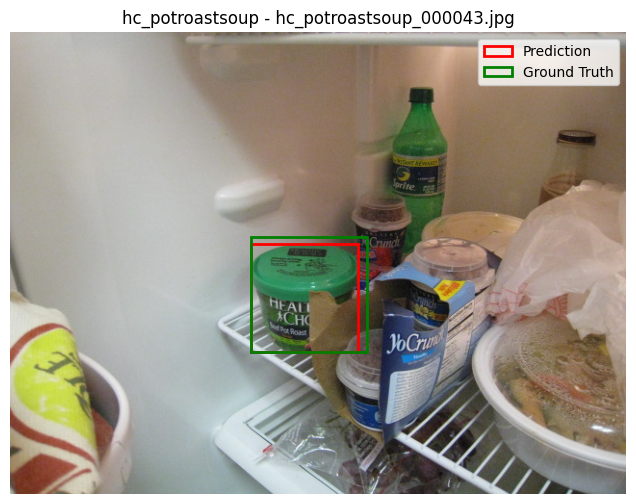

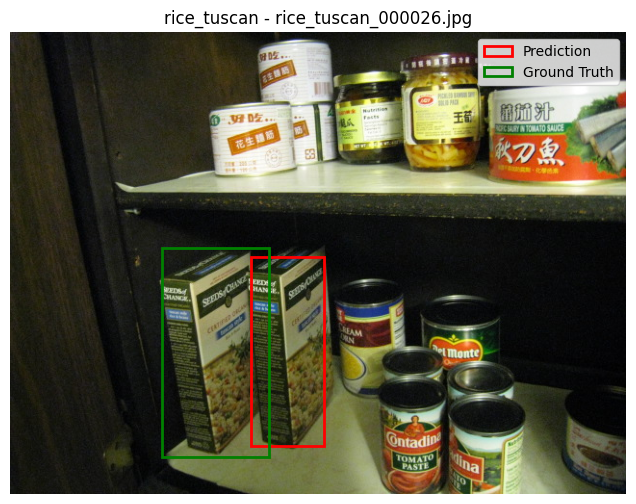

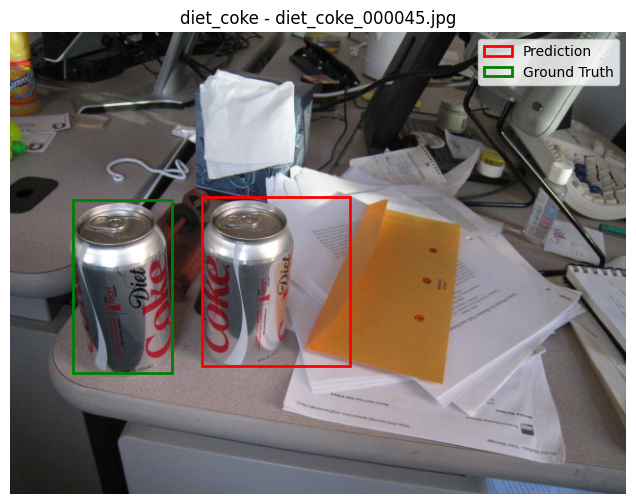

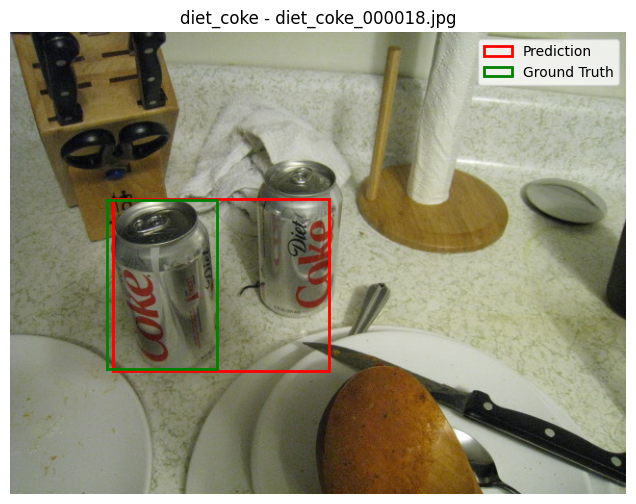

In [ ]:
# === 1. Load predictions CSV ===
preds_path = f"{input_dir}/sam2_predictions.csv"
preds_df = pd.read_csv(preds_path)

# Convert bounding box strings "[..]" -> Python list
preds_df['pred_box'] = preds_df['pred_box'].apply(eval)

# === 2. Visualization function ===
def visualize_from_csv(img_name, df, img_dir, show_gt=True):
    """Visualize predicted box (and ground truth if available)."""
    row = df[df['image'] == img_name].iloc[0]
    img_path = os.path.join(img_dir, img_name)

    # Open image
    img = Image.open(img_path)
    fig, ax = plt.subplots(figsize=(10, 6))
    ax.imshow(img)

    # Draw predicted box (red)
    xmin, xmax, ymin, ymax = row['pred_box']
    rect = patches.Rectangle(
        (xmin, ymin), xmax - xmin, ymax - ymin,
        linewidth=2, edgecolor='red', facecolor='none', label='Prediction'
    )
    ax.add_patch(rect)

    # Draw ground truth if exists
    if show_gt:
        gt_path = img_path.replace(".jpg", "_1_gt.png")
        if os.path.exists(gt_path):
            gt_mask = np.array(Image.open(gt_path))
            contours, _ = cv2.findContours(gt_mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
            if contours:
                x, y, w, h = cv2.boundingRect(contours[0])
                gt_rect = patches.Rectangle(
                    (x, y), w, h,
                    linewidth=2, edgecolor='green', facecolor='none', label='Ground Truth'
                )
                ax.add_patch(gt_rect)

    # Finalize
    plt.title(f"{row['object']} - {img_name}")
    plt.legend()
    plt.axis("off")
    plt.show()

# === 3. Visualize multiple samples ===
print(f"✅ Total predictions available: {len(preds_df)}")

# Change sample_size to len(preds_df) if you want ALL images
sample_size = min(6, len(preds_df))

for _, row in preds_df.sample(sample_size).iterrows():
    visualize_from_csv(row['image'], preds_df, input_dir, show_gt=True)


In [ ]:


def extract_gt_boxes(mask_dir):
    """Extract bounding boxes from all ground truth masks"""
    gt_boxes = []

    for mask_file in os.listdir(mask_dir):
        if mask_file.endswith('_gt.png'):
            mask_path = os.path.join(mask_dir, mask_file)
            mask = cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE)

            # Find contours
            contours, _ = cv2.findContours(mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

            for contour in contours:
                x, y, w, h = cv2.boundingRect(contour)
                gt_boxes.append({
                    'image': mask_file.replace('_gt.png', '.jpg'),
                    'gt_box': f"[{x}, {x+w}, {y}, {y+h}]"
                })

    return pd.DataFrame(gt_boxes)

# Run extraction
gt_df = extract_gt_boxes(input_dir)
gt_df.to_csv(f"{input_dir}/ground_truth_boxes.csv", index=False)
print(f"✅ Extracted {len(gt_df)} ground truth boxes")

✅ Extracted 750 ground truth boxes


In [ ]:
print(gt_df.head())
print("Total GT boxes:", len(gt_df))


                          image                gt_box
0        carton_oj_000006_1.jpg    [3, 202, 240, 415]
1        diet_coke_000009_1.jpg  [369, 473, 115, 293]
2  hc_potroastsoup_000049_2.jpg  [273, 384, 146, 274]
3   can_tomatosoup_000012_1.jpg   [109, 190, 43, 154]
4         juicebox_000031_1.jpg  [356, 439, 198, 354]
Total GT boxes: 750


In [ ]:
preds_df = pd.read_csv(f"{input_dir}/sam2_predictions.csv")
print(preds_df.head())
print("Total Predictions:", len(preds_df))


        object                   image              pred_box
0  can_chowder  can_chowder_000002.jpg  [249, 331, 150, 278]
1  can_chowder  can_chowder_000016.jpg  [246, 330, 171, 263]
2  can_chowder  can_chowder_000006.jpg  [439, 533, 132, 252]
3  can_chowder  can_chowder_000050.jpg  [176, 271, 322, 431]
4  can_chowder  can_chowder_000032.jpg  [206, 470, 270, 479]
Total Predictions: 258


In [ ]:
import pandas as pd

# Load files
preds_df = pd.read_csv(f"{input_dir}/sam2_predictions.csv")
gt_df = pd.read_csv(f"{input_dir}/ground_truth_boxes.csv")

# --- Normalize filenames ---
# Remove suffix like "_1" or "_2" before ".jpg"
gt_df['image'] = gt_df['image'].str.replace(r'_\d+\.jpg$', '.jpg', regex=True)

print("After normalization:")
print(gt_df['image'].unique()[:5])
print(preds_df['image'].unique()[:5])

# --- Merge ---
merged_df = pd.merge(preds_df, gt_df, on='image')
print(f"✅ Matched {len(merged_df)} predictions with ground truth")

# --- IoU Calculation ---
def calculate_iou(box1, box2):
    """IoU between two boxes: [xmin, xmax, ymin, ymax]"""
    xA = max(box1[0], box2[0])
    yA = max(box1[2], box2[2])
    xB = min(box1[1], box2[1])
    yB = min(box1[3], box2[3])

    inter_area = max(0, xB - xA) * max(0, yB - yA)
    box1_area = (box1[1] - box1[0]) * (box1[3] - box1[2])
    box2_area = (box2[1] - box2[0]) * (box2[3] - box2[2])
    union_area = box1_area + box2_area - inter_area

    return inter_area / union_area if union_area > 0 else 0

# Apply IoU
merged_df['pred_box'] = merged_df['pred_box'].apply(eval)
merged_df['gt_box'] = merged_df['gt_box'].apply(eval)
merged_df['IoU'] = merged_df.apply(lambda r: calculate_iou(r['pred_box'], r['gt_box']), axis=1)

# Save results
merged_df.to_csv(f"{input_dir}/iou_results.csv", index=False)
print("✅ IoU results saved!")

# --- Summary ---
print("\nMean IoU per object class:")
print(merged_df.groupby('object')['IoU'].mean())


After normalization:
['carton_oj_000006.jpg' 'diet_coke_000009.jpg'
 'hc_potroastsoup_000049.jpg' 'can_tomatosoup_000012.jpg'
 'juicebox_000031.jpg']
['can_chowder_000002.jpg' 'can_chowder_000016.jpg'
 'can_chowder_000006.jpg' 'can_chowder_000050.jpg'
 'can_chowder_000032.jpg']
✅ Matched 412 predictions with ground truth
✅ IoU results saved!

Mean IoU per object class:
object
can_chowder        0.448047
can_soymilk        0.405793
can_tomatosoup     0.276007
carton_oj          0.541873
carton_soymilk     0.496111
diet_coke          0.411536
hc_potroastsoup    0.520769
juicebox           0.478320
rice_tuscan        0.378443
ricepilaf          0.239382
Name: IoU, dtype: float64
